## <font color='green'> Imports and Initialization

In [4]:
import os
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from pyspark.sql.functions import lit
from pyspark.ml.image import ImageSchema
import tensorflow.compat.v2 as tf
from sparkdl import DeepImagePredictor
from sparkdl import DeepImageFeaturizer 
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline
from pyspark.sql import SparkSession
import pandas as pd
import seaborn as sns

from pyspark.sql.functions import col, countDistinct

from pyspark.ml.feature import VectorAssembler, StringIndexer, OneHotEncoder
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.classification import LogisticRegressionModel


import matplotlib.pyplot as plt
import random

In [5]:
import findspark
findspark.init() 
spark = SparkSession.builder.appName("CIE 427 - Big Data Project").getOrCreate()
sc = spark.sparkContext
sc

<SparkContext master=local[*] appName=CIE 427 - Big Data Project>

## <font color='green'> Analysis

In [110]:
samples_path = []
plants_name = []
data_folder = 'data/train' # replace with the actual path to your data folder
plant_folders = [f for f in os.listdir(data_folder) if os.path.isdir(os.path.join(data_folder, f))]
print('There are {} types of plants in the dataset.'.format(len(plant_folders)))

for plant_folder in tqdm(plant_folders):
    plant_path = os.path.join(data_folder, plant_folder)
    image_files = [f for f in os.listdir(plant_path)] # assuming the image files have .jpg or .png extensions
    sample_image = os.path.join(plant_path, image_files[0])
    samples_path.append(sample_image)
    plants_name.append(plant_folder.split('/')[-1])

print(plants_name)

There are 38 types of plants in the dataset.


  0%|          | 0/38 [00:00<?, ?it/s]

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite',

In [111]:
# 58 plant types
len(samples_path)

38

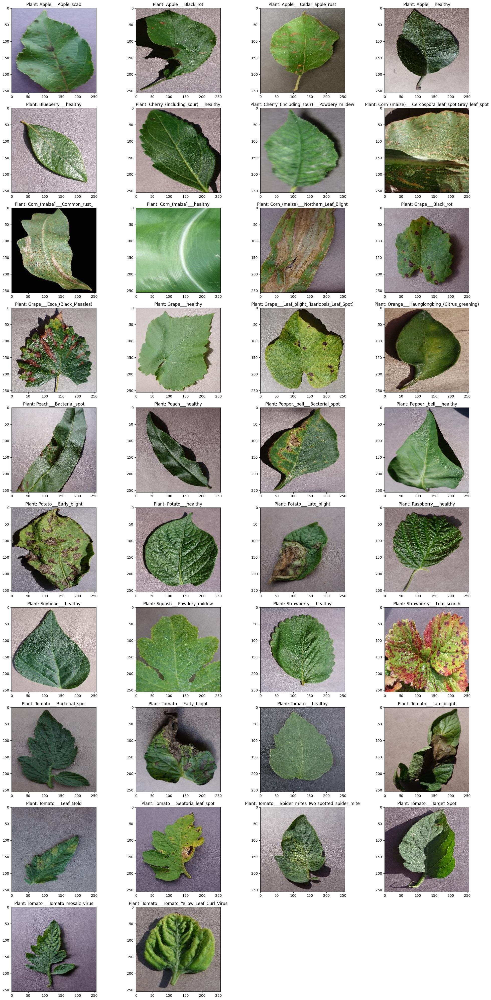

In [113]:
# create a 2x5 grid of subplots
fig, axs = plt.subplots(10, 4, figsize=(20, 40))

# flatten the 2D array of subplots to make it easier to iterate through
axs = axs.ravel()

# iterate through the subplots and display images
for i, ax in enumerate(axs):
    # assuming you have a list of image files called 'image_files'
    if i < len(samples_path):
        img = plt.imread(samples_path[i])
        ax.imshow(img)
        ax.set_title(f'Plant: {plants_name[i]}')
    else:
        ax.axis('off')

# remove the extra space between subplots
plt.tight_layout()
plt.show()

In [107]:
plants = []
NumberOfDiseases = 0
df = spark.read.csv('features_old.csv', header=True, inferSchema=True)
columns_names = df.select(['label']).distinct().collect()
for plant in columns_names:
    plant = plant[0]
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")
# number of unique plants
print("Number of plants: {}".format(len(plants)))
# number of unique diseases
print("Number of diseases: {}".format(NumberOfDiseases))

Unique Plants are: 
['Pepper,_bell', 'Grape', 'Cherry_(including_sour)', 'Potato', 'Apple', 'Orange', 'Corn_(maize)', 'Squash', 'Tomato', 'Soybean', 'Strawberry', 'Peach', 'Blueberry', 'Raspberry']
Number of plants: 14
Number of diseases: 26


## <font color='green'> Processing

In [6]:
# import dataset with features
df = spark.read.csv('all_features_final.csv', header=True, inferSchema=True)

In [7]:
# select the featurtes to be assembled
features_names = list(df.columns[3:-3])
len(features_names)

512

In [8]:
# gather features using vector assembler
vec_assembler = VectorAssembler(inputCols=features_names, outputCol="features")
piped_data = vec_assembler.transform(df)

In [9]:
data = piped_data

# create a list of the unique 'id' values
id_list = data.select("id").distinct().collect()

# shuffle the list of 'id' values
random.shuffle(id_list)

# split the list of 'id' values into train and test sets
split_index = int(len(id_list) * 0.9)
train_ids = set(id_list[:split_index])
test_ids = set(id_list[split_index:])
train_ids = [my_id[0] for my_id in train_ids]
test_ids = [my_id[0] for my_id in test_ids]
train_data=data[data.id.isin(train_ids)]
test_data=data[data.id.isin(test_ids)]
train_data = train_data.select(['label','features'])
test_data = test_data.select(['label','features'])

In [10]:
train_df, test_df = train_data, test_data

## <font color='green'> Training on OneVsRest Classifier

In [ ]:
from pyspark.ml.classification import LogisticRegression, OneVsRest
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Create the multiclass classifier
ovr = OneVsRest(classifier=LogisticRegression(featuresCol='features', labelCol='label'))

# Fit the model
model = ovr.fit(train_data)

# Make predictions on the test set
predictions = model.transform(test_data)



In [23]:
# Create an evaluator
evaluator = BinaryClassificationEvaluator().setMetricName('areaUnderROC').setLabelCol('label').setRawPredictionCol('features')

# Compute the area under the ROC curve
roc = evaluator.evaluate(predictions)
print('ROC values is {}'.format(roc))

ROC values is 1.0


## <font color='green'> Training On Logistic Regression

In [11]:
lr = LogisticRegression(featuresCol='features', labelCol='label')
lr_model = lr.fit(train_df)

In [94]:
lr_model.summary.accuracy

0.9849521852525093

In [95]:
summary = lr_model.evaluate(test_df)
summary.accuracy

0.9780938833570413

In [71]:
# check if modle has summary
lr_model.hasSummary

True

In [72]:
trainingSummary = lr_model.summary

### ROC

In [80]:
FPR = trainingSummary.falsePositiveRateByLabel
TPR = trainingSummary.truePositiveRateByLabel
roc_df = pd.DataFrame(columns=['FPR', 'TPR'])
roc_df['FPR'] = FPR
roc_df['TPR'] = TPR
roc_df.head()

,FPR,TPR
0,0.000300,0.990832
1,0.000133,0.995167
2,0.000056,0.989550
3,0.000244,0.998336
4,0.000097,0.997625


(0.0, 1.1)

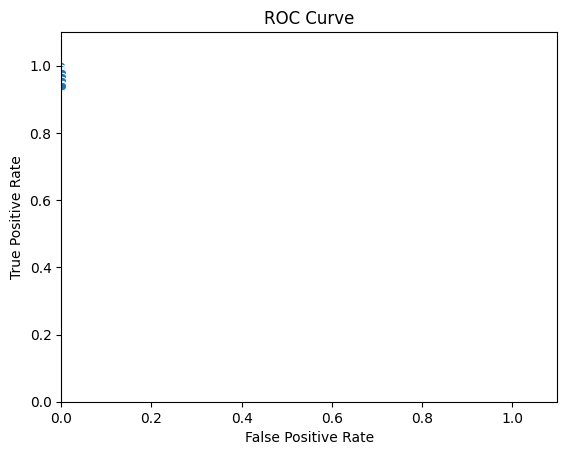

In [82]:
sns.lineplot(data=roc_df, x="FPR", y="TPR",  marker="o")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve')
plt.xlim(0,1.1)
plt.ylim(0,1.1)

### Precision and recall 

In [96]:
precision = trainingSummary.precisionByLabel
recall = trainingSummary.recallByLabel
pr_recall_df = pd.DataFrame(columns=['precision', 'recall'])
pr_recall_df['precision'] = precision
pr_recall_df['recall'] = recall
pr_recall_df = pr_recall_df.iloc[2:, :]
pr_recall_df.head()

,precision,recall
2,0.997838,0.989550
3,0.991734,0.998336
4,0.996310,0.997625
5,0.997900,0.997114
6,0.998876,0.996915


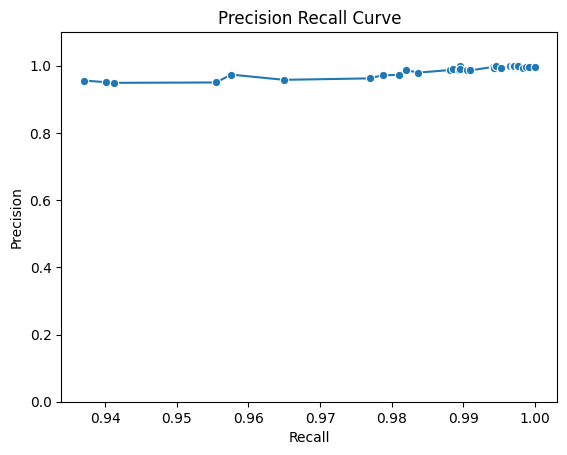

In [99]:
sns.lineplot(data=pr_recall_df, x="recall", y="precision",  marker="o")
# plt.scatter(pr_recall_df['recall'],pr_recall_df['precision'])
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.ylim(0,1.1)
plt.ylim(0,1.1)
plt.title('Precision Recall Curve');


### Model Coefficients and Intercepts

In [85]:
print("Coefficients: \n" + str(lr_model.coefficientMatrix))
print("Intercept: " + str(lr_model.interceptVector))

Coefficients: 
DenseMatrix([[-6.94004519e-04, -4.87841096e-04, -1.75595615e-03, ...,
              -4.13499083e-04, -1.01628402e-03, -2.45710448e-04],
             [ 3.81319644e-01, -1.24056233e+00,  9.50439431e-01, ...,
              -1.47222207e+00,  7.14215541e-01, -1.58477206e+00],
             [-1.67430037e-01, -5.13446961e-01,  1.17466290e+00, ...,
               7.27140381e-02,  2.17257675e-01, -3.31905697e-01],
             ...,
             [-9.36096449e-01,  1.25914091e+00, -8.79549894e-01, ...,
              -1.26890767e-01, -6.75424959e-01, -3.12553353e-01],
             [ 3.07306450e-01, -1.02340997e+00, -1.53051031e+00, ...,
               8.82704525e-01,  8.31745349e-02,  3.10891949e-01],
             [-1.70448304e-01,  2.59906407e-01, -1.27143875e+00, ...,
              -6.88312958e-03,  1.60472576e-01,  6.60603074e-01]])
Intercept: [-8.050874920165654,0.31453060991137516,0.281348524453285,0.17878964536927053,0.29711385779346927,0.18631990266294018,0.19274929796914023,0

In [88]:
# Obtain the objective per iteration
objectiveHistory = trainingSummary.objectiveHistory
print("objectiveHistory:")
for objective in objectiveHistory:
    print(objective)



objectiveHistory:
3.635917817323255
3.189546848789544
2.9192802878948076
2.785920285368632
2.6643940477338983
2.601302360975429
2.569966786727955
2.4563440753965513
2.3876229193518475
2.312922771202653
2.2716872196813607
2.194713493000496
2.152895978955164
2.089165603899854
2.056565442356684
2.0186024119725188
1.9815443667697268
1.9425007835140762
1.9127666335309663
1.8766101010255978
1.8449711000841413
1.7862324791989481
1.760032780787328
1.731988086993959
1.7080374686535855
1.6704448704448283
1.620632075281669
1.569050017926342
1.5388446572987142
1.5181518119450492
1.5045460618797892
1.4941058909286582
1.483522083868327
1.4715764871193102
1.4545884575344605
1.4435558685429999
1.4297801704955828
1.417673372443714
1.40792363074104
1.3995688295354767
1.3934552904604756
1.3860993448849732
1.3795728688254867
1.378220476176148
1.3753157744637714
1.3743657247631187
1.3722462103401978
1.3688159423638606
1.3656579721010325
1.3617704497249639
1.358966705594384
1.3565892378420878
1.353690789904

### Evaluating on Test

In [100]:
output = lr_model.transform(test_df)
output.show()

+-----+--------------------+--------------------+--------------------+----------+
|label|            features|       rawPrediction|         probability|prediction|
+-----+--------------------+--------------------+--------------------+----------+
|    1|[0.36002475,-0.02...|[-8.3990165433205...|[7.11663386934030...|       1.0|
|    1|[0.40706402,0.059...|[-8.4090890226542...|[1.63004527495937...|       1.0|
|    1|[-0.097981334,-0....|[-8.3939284433139...|[3.13587507136450...|       1.0|
|    1|[0.16825753,0.037...|[-8.3936576940814...|[8.34812206637269...|       1.0|
|    1|[0.20060404,0.206...|[-8.3959003484003...|[1.18758220519501...|       1.0|
|    1|[0.3200967,0.2385...|[-8.3979233001999...|[1.10815352221417...|       1.0|
|    1|[0.41394156,0.008...|[-8.4067285912571...|[2.79174495179879...|       1.0|
|    1|[0.23867205,-0.03...|[-8.3941010628629...|[2.71017015856644...|       1.0|
|    1|[0.31810892,-0.07...|[-8.3996914562953...|[1.79718374573736...|       1.0|
|    1|[0.110390

In [101]:
summary = lr_model.evaluate(test_df)
summary.accuracy

0.9780938833570413